In this notebook, we explore visual representations of the relationship of the data in EmoDB and the most important features from our best model XGBClassifier with 100.00%	train and 81.52% test F1 macro score.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import pickle
import math
import itertools

# packages for models
from xgboost import XGBClassifier

# import own functions
from ipynb.fs.full.Functions import load_train_test_data, model_eval, run_gridsearchCV, load_model, feature_importance

import warnings
warnings.filterwarnings('ignore')

In [2]:
# load data
df_most_important97 = pd.read_pickle('../results/df_prep_most_important97.pkl')

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_most_important97, verbose=False, test_size=0.3)

In [3]:
# load best model
xgb_best_model = load_model('XGBClassifier', 'f1_macro', name_spec='final')

[11:09:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:415: 
  Loading from a raw memory buffer (like pickle in Python, RDS in R) on a CPU-only
  machine. Consider using `save_model/load_model` instead. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.  Changing `tree_method` to `hist`.
[11:09:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:425: Changing updater from `grow_gpu_hist` to `grow_quantile_histmaker`.
[11:09:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1


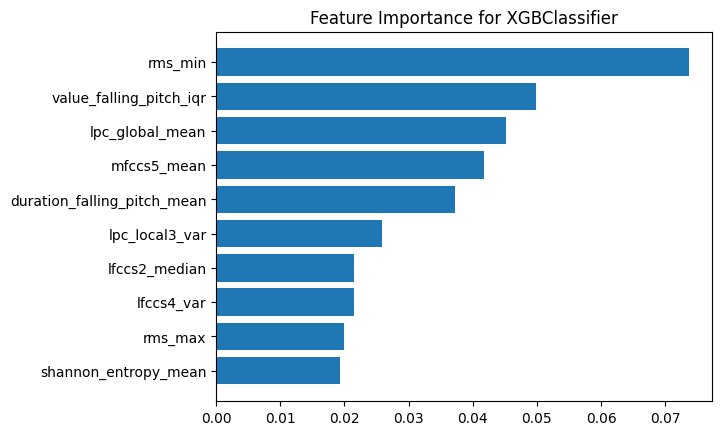

In [4]:
feature_imp_xgb = feature_importance(xgb_best_model, X_test, y_test, top=10)

In [5]:
def plot_boxplots(df, features, graphs_per_row):
    num_features = len(features)
    num_rows = math.ceil(num_features / graphs_per_row)

    fig, axes = plt.subplots(num_rows, graphs_per_row, figsize=(15, 4*num_rows))
    fig.suptitle('Box Plots: Feature vs. Target', fontsize=16)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    # Get target values from the dataframe
    target_values = df['label'].values

    for i, feature in enumerate(features):
        ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]

        # Get feature values from the dataframe
        feature_values = df[feature].values

        # Grouping feature values by target label
        data = {}
        for feature_val, target_val in zip(feature_values, target_values):
            if target_val not in data:
                data[target_val] = []
            data[target_val].append(feature_val)
        
        # Sort the keys for better overview
        sorted_keys = sorted(data, key=lambda x: int(x))
        data = [data[label] for label in sorted_keys]

        # Creating the box plot
        ax.boxplot(data)

        # Customizing the plot
        ax.set_title(feature)
        ax.set_xlabel('Target Label')
        ax.set_ylabel('Feature')

        # Adding x-axis labels
        ax.set_xticklabels(sorted_keys)

    # Removing any empty subplots
    if num_features < num_rows * graphs_per_row:
        for i in range(num_features, num_rows * graphs_per_row):
            ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]
            fig.delaxes(ax)

    plt.show()

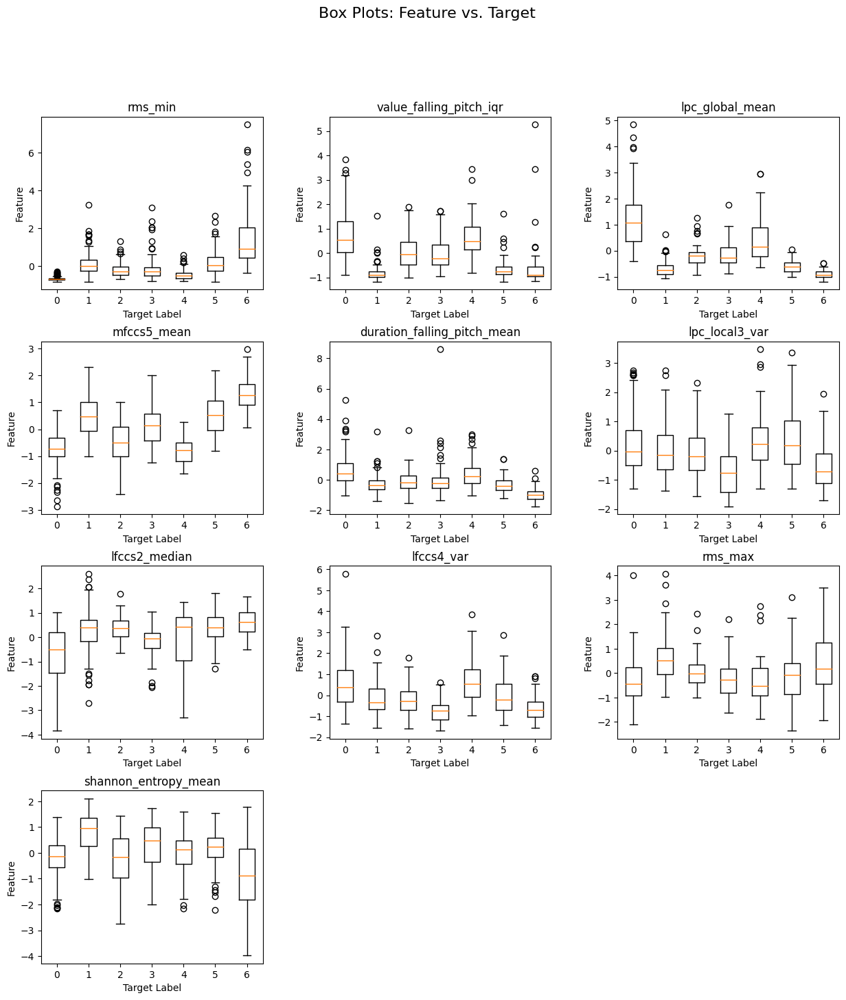

In [6]:
plot_boxplots(df_most_important97, feature_imp_xgb, 3)

- Especially rms_min, and duration_falling_pitch_mean, but also value_falling_pitch_iqr, and lpc_global_mean have smaller boxes for all or some of the emotion labels, indicating a smaller spread in data. This in return shows why they are good in explaining the data set. 
- rms_min shows overall the smallest boxes (iqr regions) while showing slightly different ranges in numerics per label. This explains why it is the most important feature for EmoDB. Nonetheless, it shows quite many outliers for the different labels. Specifically, anger (0) and happiness (4) have a very small iqr range. Since differentiating between these two emotions is usually the the most difficult, we can see that rms_min is really helpful here. The highest spread in data is for sadness (6). 
- In value_falling_pitch_iqr boredom, neutral, and sadness have quite similar iqrs, especially compared to the other labels. These three are also often hard to differentiate and is underlined here. This effect is also seen with lpc_global_mean. Other than that the median values of the other emotions are quite easy to differentiate and should help for the classification. 
- mfccs5_mean shows the highest variability in median values between all 6 emotion classes. Even though the spread of data is higher than in other features, the medians are quite easy to distinguish. Again here, we see nonetheless that anger (0) and happiness (4), and boredom (1) and neutral (5) have very similar boxes which makes it harder for the classification. mfccs5_mean shows also the least outliers over all features. Only for anger we can see many outliers.
- Regarding the iqrs of the labels, we can see why the combination of different features is helpful. Looking at the hardcase anger (0) and happiness (4) over all features, we see that they are very often quite similar too each other but lpc_global_mean and lfccs2_median also show slight differences. Similarly, boredom (1) and neutral (5) appear almost the same over all features but rms_max, and shannon_entropy_mean seem to help here. Moreover, we can recognize that different features are good at differentiating well for one specific class. Where rms_min and mfccs5_mean indicate a difference for sadness (6), lpc_global_mean and lfccs2_median help for anger (0), duration_falling_pitch_mean help for both these classes, lpc_local3_var for fear (3), lfccs4_var for happiness (4), rms_max and shannon_entropy_mean for boredom (1). 
- Overall, the combination of these relationships with the target variable helps the model to make a suitable classification. Nonetheless, there is still room for improvement.

In [7]:
def plot_violinplots(df, features, graphs_per_row):
    num_features = len(features)
    num_rows = math.ceil(num_features / graphs_per_row)

    fig, axes = plt.subplots(num_rows, graphs_per_row, figsize=(15, 4*num_rows))
    fig.suptitle('Violin Plots: Feature vs. Target', fontsize=16)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    # Get target values from the dataframe
    target_values = df['label'].values

    for i, feature in enumerate(features):
        ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]

        # Get feature values from the dataframe
        feature_values = df[feature].values

        # Grouping feature values by target label
        data = {}
        for feature_val, target_val in zip(feature_values, target_values):
            if target_val not in data:
                data[target_val] = []
            data[target_val].append(feature_val)
            
        # Sort the keys for better overview
        sorted_keys = sorted(data, key=lambda x: int(x))
        data = [data[label] for label in sorted_keys]
        
        # Creating the violin plot
        ax.violinplot(data)

        # Customizing the plot
        ax.set_title(feature)
        ax.set_xlabel('Target Label')
        ax.set_ylabel('Feature')

        # Adding x-axis labels
        ax.set_xticks(range(1, len(sorted_keys) + 1))
        ax.set_xticklabels(sorted_keys)

    # Removing any empty subplots
    if num_features < num_rows * graphs_per_row:
        for i in range(num_features, num_rows * graphs_per_row):
            ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]
            fig.delaxes(ax)

    plt.show()

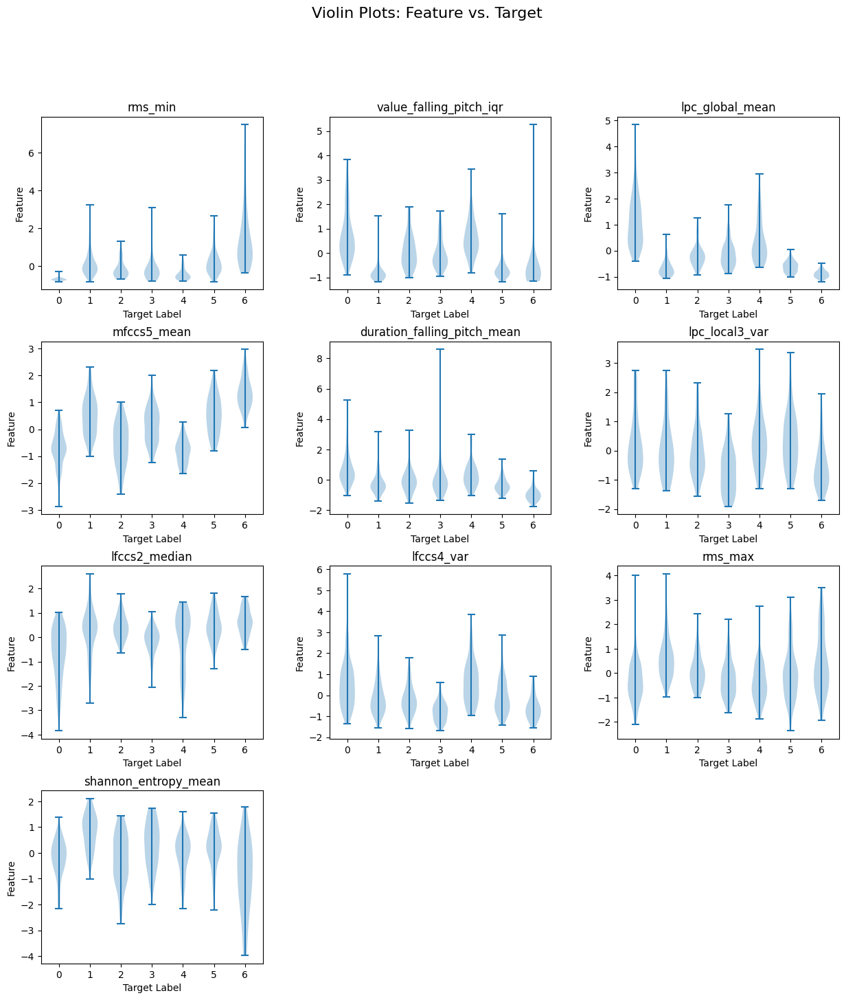

In [8]:
plot_violinplots(df_most_important97, feature_imp_xgb, 3)

The violines help us in better understanding the data distribution according to the features. 
- rms_min, value_falling_pitch_iqr, duration_falling_pitch_mean show for almost all classes centered distributions at some hight where the other features have more longer violines where the distribution is less centered. 
- Specifically, anger (0) is very dense in rms_min at a specific height which makes it easier to distinguish, also compared to happiness (4). 
- As seen before, value_falling_pitch_iqr makes it quite easy to differentiate between the three classes boredom (1), neutral (5) and sadness (6) with the other classes. The violines for these three classes are much less spread then for the others but at the same time it makes it hard to distinguish within these classes. 
- With mfccs5_mean it becomes clear that the data distributions are quite widely spread making it harder to distinguish classes only with this feature. Nonetheless, it is more centered for anger (0). 
- The distributions seem to be one-modal for most cases. For others, we can see a tendency for bimodal.

# Best visual representation in a 3D room

In [9]:
def find_best_3d_representation(df, feature_names, graphs_per_row):
    
    features = df[feature_names].values
    target_labels = df['label'].values

    # Generate all possible combinations of 3 features
    combinations = list(itertools.combinations(range(len(feature_names)), 3))
    
    # Extract number of rows to plot for subplots
    num_combinations = len(combinations)
    num_rows = math.ceil(num_combinations / graphs_per_row)
    
    # Create figure
    fig, axes = plt.subplots(num_rows, graphs_per_row, figsize=(15, 4*num_rows), subplot_kw={'projection': '3d'})
    plt.subplots_adjust(left=0.05, right=0.8, bottom=0.05, top=0.95, wspace=0.00000000001, hspace=0.3)
    
    best_score = 0
    best_combination = None

    # Evaluate and compare each combination
    for i, combination in enumerate(combinations):
        ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]
        #ax = fig.add_subplot(num_rows, graphs_per_row, i+1, projection='3d')
        
        # Extract features for the current combination
        selected_features = features[:, combination]

        # Create the scatter plot
        for label in np.unique(target_labels):
            indices = np.where(target_labels == label)
            ax.scatter(selected_features[indices, 0], selected_features[indices, 1], selected_features[indices, 2], label=f'Class {label}')
        ax.set_xlabel(feature_names[combination[0]], fontsize=8)
        ax.set_ylabel(feature_names[combination[1]], fontsize=8)
        ax.set_zlabel(feature_names[combination[2]], fontsize=8)
        ax.zaxis.labelpad=-0.7
        ax.set_aspect('equal')

        # Calculate the score based on class separability
        score = len(combinations) / ax.dist

        # Update the best combination if the score is higher
        if score > best_score:
            best_score = score
            best_combination = combination
    
    # Removing any empty subplots
    if num_combinations < num_rows * graphs_per_row:
        for i in range(num_combinations, num_rows * graphs_per_row):
            ax = axes[i // graphs_per_row, i % graphs_per_row] if num_rows > 1 else axes[i % graphs_per_row]
            fig.delaxes(ax)
    
    plt.show()

    # Return the best combination of features
    print('The best feature combination for a visual representation is: {}'.format([feature_names[i] for i in best_combination]))

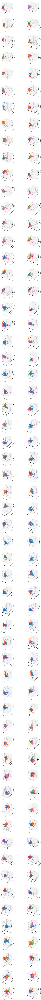

The best feature combination for a visual representation is: ['rms_min', 'value_falling_pitch_iqr', 'lpc_global_mean']


In [10]:
find_best_3d_representation(df_most_important97, list(feature_imp_xgb), 2)

As exptected, the combination of the three most important features ('rms_min', 'value_falling_pitch_iqr', 'lpc_global_mean') provides also the best visual representation for the classes in a 3D room. We can have a closer look with an interactive 3D map.

In [11]:
def scatter_plot_3d_interactive(df, features):
    data = [
        go.Scatter3d(
            x=df[features[0]],
            y=df[features[1]],
            z=df[features[2]],
            mode='markers',
            marker=dict(
                size=5,
                color=df['label'],
                colorscale='Viridis',
                opacity=0.8, 
                colorbar=dict(title='Target')
            )
        )
    ]

    layout = go.Layout(
        scene=dict(
            xaxis=dict(title=features[0]),
            yaxis=dict(title=features[1]),
            zaxis=dict(title=features[2])
        ),
        title='Interactive 3D Scatter Plot'
    )

    fig = go.Figure(data=data, layout=layout)
    fig.show()

In [12]:
scatter_plot_3d_interactive(df_most_important97, ['rms_min', 'value_falling_pitch_iqr', 'lpc_global_mean'])

- sadness (6) is the most easiest to distinguish across rms_min and value_falling_pitch_iqr.
- anger (0) is quite good to distinguish across the plane value_falling_pitch_iqr and lpc_global_mean. But happiness (4) also appears mostly around that region. 
- neutral (5) is quite dense in the corner mainly across the plane rms_min and value_falling_pitch_iqr.
</br> </br> 
- anger (0) has overall the smallest rms_min value, is quite widely spread for value_falling_pitch_iqr up until 3.8, and spread all over for lpc_global_mean but more dense in the down-middle area. 
</br> </br> 
We also want to get real numbers of min and max for these features:

In [13]:
for feat in ['rms_min', 'value_falling_pitch_iqr', 'lpc_global_mean']:
    print('\n The summary statistics for {} are:'.format(feat))
    display(df_most_important97.groupby('label')[feat].describe())


 The summary statistics for rms_min are:


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,127.0,-0.672299,0.091899,-0.811974,-0.728512,-0.693532,-0.647890,-0.279417
1,81.0,0.154148,0.668303,-0.811974,-0.249387,-0.003808,0.351949,3.255858
2,46.0,-0.150671,0.470363,-0.687218,-0.465672,-0.294254,-0.020761,1.329550
3,69.0,-0.051576,0.779872,-0.774754,-0.513472,-0.282635,-0.046403,3.081265
4,71.0,-0.416569,0.307290,-0.777099,-0.645688,-0.488403,-0.334180,0.586379
5,79.0,0.216319,0.668798,-0.811974,-0.251602,0.052172,0.483144,2.674223
6,62.0,1.546337,1.720511,-0.339399,0.431011,0.902098,2.052564,7.479495



 The summary statistics for value_falling_pitch_iqr are:


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,127.0,0.787346,1.035797,-0.895505,0.033052,0.536731,1.301287,3.825116
1,81.0,-0.809381,0.368901,-1.168107,-0.993862,-0.897082,-0.760365,1.532914
2,46.0,0.099189,0.714234,-1.005844,-0.464980,-0.063619,0.465557,1.880285
3,69.0,0.016988,0.649439,-0.949884,-0.476549,-0.234819,0.356232,1.732533
4,71.0,0.657808,0.803283,-0.805862,0.149163,0.492425,1.083311,3.432596
5,79.0,-0.658396,0.413780,-1.171266,-0.878300,-0.751476,-0.557898,1.611927
6,62.0,-0.562243,1.007673,-1.159936,-0.946639,-0.887413,-0.570933,5.268180



 The summary statistics for lpc_global_mean are:


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,127.0,1.175023,1.040854,-0.415922,0.360699,1.063877,1.760952,4.840750
1,81.0,-0.678541,0.300121,-1.060744,-0.911468,-0.742715,-0.564022,0.635848
2,46.0,-0.175346,0.450563,-0.933785,-0.457935,-0.204035,-0.071004,1.263818
3,69.0,-0.143876,0.516850,-0.875555,-0.465910,-0.264312,0.130867,1.763008
4,71.0,0.388755,0.870698,-0.648021,-0.207080,0.148259,0.879554,2.948515
5,79.0,-0.612504,0.225724,-1.001756,-0.793021,-0.617821,-0.466484,0.032218
6,62.0,-0.894944,0.153535,-1.188370,-1.008106,-0.920123,-0.813043,-0.470892


With these observations, it is at least possible to have a visualization of emotions between different audio features. Even though, some are a bit hard to differentiate, we can get an understanding of how features like rms, pitch, or lpc in speech change with different emotions. Specifically, anger (0) and sadness (6) are very different in this 3D arangement. We can understand why anger (0) and happiness (4), as well as boredom (1) and neutral (5) are hard to distinguish just by looking at the data distribution. Also the distributions for neutral (5) and boredom (1) are much more dense then for other emotions indicating a lesser variability in the given features.